# Examining Diagnostics Using Intake-ESM and Holoviews
In previous weeks, we have looked at [building Intake-ESM catalogs from history files](https://ncar.github.io/esds/posts/2021/ecgtools-history-files-example/) and [visualizing CESM output using Holoviews and Datashader)](https://ncar.github.io/esds/posts/2021/cesm-datashader/), but this week we are putting together a few of those pieces to visualize a comparison between model runs.

One of the first ESDS blog posts looked at [building an interactive dashboard to look at plots](https://ncar.github.io/esds/posts/2021/Interactive_Dashboard/), using high resolution ocean model output as the dataset. One of the limitations of that approach is that the images are static - we are pulling in `png`s, and rending on the page, as opposed to more interactive options. In this example, we will read in data generated from [ecgtools](https://ecgtools.readthedocs.io/en/latest/), from a directory only accessible via NCAR's high performance computing center.

## Imports

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
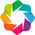

In [2]:
import ast

import datashader
import holoviews as hv
import intake
import matplotlib.pyplot as plt
import panel as pn
import xarray as xr
from distributed import Client
from holoviews.operation.datashader import datashade, rasterize, regrid, shade
from ncar_jobqueue import NCARCluster

pn.extension()
hv.extension('bokeh')

## Spin up a Dask Cluster
We spin up a cluster, incuding 20 total workers

In [3]:
cluster = NCARCluster()
cluster.scale(20)
client = Client(cluster)
cluster

## Read in the data
As mentioned previously, we are reading in data from within the GLADE filesystem at NCAR. The special line
```python
ast.literal_eval
```
is included since there are multiple variables in the variables column, an artifact of using the default "history" file output (check out our previous [post here](https://ncar.github.io/esds/posts/2021/ecgtools-history-files-example/#what-s-a-history-file) for more information about this type of model output)

In [4]:
catalog = intake.open_esm_datastore(
    "/glade/work/mgrover/cesm-validation-catalog.json",
    csv_kwargs={"converters": {"variables": ast.literal_eval}},
    sep="/",
)
catalog

,unique
component,1
stream,4
date,2501
case,3
member_id,2
frequency,4
variables,545
path,11103


We see that there are three cases included in this catalog

In [5]:
catalog.df.case.unique()

array(['b1850.f19_g17.validation_nuopc.004',
       'b1850.f19_g17.validation_mct.004',
       'b1850.f19_g17.validation_mct.002'], dtype=object)

### Subset for monthly output from the last 20 years

We start by subsetting for monthly output

In [6]:
catalog_subset = catalog.search(frequency='month_1')

Next, we subset for the last 20 years of data. Since this is monthly output, the last twenty years corresponds to
```
12 months * 20 years = 240
```

In [7]:
dates = sorted(catalog_subset.df.date.unique())[-240:]
print(dates[:12], dates[-12:])

['0081-01', '0081-02', '0081-03', '0081-04', '0081-05', '0081-06', '0081-07', '0081-08', '0081-09', '0081-10', '0081-11', '0081-12'] ['0100-01', '0100-02', '0100-03', '0100-04', '0100-05', '0100-06', '0100-07', '0100-08', '0100-09', '0100-10', '0100-11', '0100-12']


In [8]:
catalog_subset = catalog_subset.search(frequency='month_1', date=dates)

Now, our catlaog includes our 3 cases with monthly data from the last 20 years of the simulation

In [9]:
catalog_subset

,unique
component,1
stream,1
date,240
case,3
member_id,2
frequency,1
variables,434
path,720


### Read in a dictionary of datasets
Using the `.to_dataset_dict()` method, we read in the datasets

In [10]:
dsets = catalog_subset.to_dataset_dict(cdf_kwargs={'use_cftime': True, 'chunks': {'time': 60}})


--> The keys in the returned dictionary of datasets are constructed as follows:
	'component/stream/case'


Taking a look at the keys, we see that the follow the convention `component/stream/casename`

In [12]:
dsets.keys()

dict_keys(['ocn/pop.h/b1850.f19_g17.validation_mct.002', 'ocn/pop.h/b1850.f19_g17.validation_nuopc.004', 'ocn/pop.h/b1850.f19_g17.validation_mct.004'])

## Compute the Temporal Average
We are interested in the average over the last 20 years, so we take the mean with respect to time. For now, we are interested in two variables:
* SALT (salinity)
* TEMP (potential temperature)

In [13]:
variables = ['TEMP', 'SALT']

In [14]:
ds_list = []
for key in dsets.keys():

    # Extract the dataset from the dictionary of datasets
    ds = dsets[key]

    # Compute the mean over time
    mean = ds.mean(dim='time')

    # Subset for the variables we are interested in
    out = mean[variables]

    # Ensure the dataset has the proper attributes
    out.attrs = ds.attrs
    out.attrs['intake_esm_varname'] = variables

    # Append to the list of datasets
    ds_list.append(out)

Concatenate the datasets from the various cases

In [15]:
merged_ds = xr.concat(ds_list, dim='case')

Ensure each of the variables has the correct attributes

In [16]:
for var in variables:
    merged_ds[var].attrs = ds[var].attrs

Each dataset has an attribute `title` which contains the casename, which we can use as one of the main dimensions or our new merged dataset

In [17]:
merged_ds.title

'b1850.f19_g17.validation_mct.002'

In [18]:
cases = []
for dset in ds_list:
    cases.append(dset.title)
merged_ds['case'] = cases

### Load in our computation
Before we start plotting, we can go ahead and call `.persist()` on our dataset which will load our temporally averaged, dataset with a subset of original variables

In [19]:
merged_ds.persist()

<xarray.Dataset>
Dimensions:  (case: 3, z_t: 60, nlat: 384, nlon: 320)
Coordinates:
  * z_t      (z_t) float32 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05
    ULONG    (nlat, nlon) float64 321.1 322.3 323.4 324.5 ... 319.2 319.6 320.0
    ULAT     (nlat, nlon) float64 -78.95 -78.95 -78.95 ... 72.42 72.41 72.41
    TLONG    (nlat, nlon) float64 320.6 321.7 322.8 323.9 ... 318.9 319.4 319.8
    TLAT     (nlat, nlon) float64 -79.22 -79.22 -79.22 ... 72.2 72.19 72.19
  * case     (case) <U34 'b1850.f19_g17.validation_mct.002' ... 'b1850.f19_g1...
Dimensions without coordinates: nlat, nlon
Data variables:
    TEMP     (case, z_t, nlat, nlon) float32 dask.array<chunksize=(1, 60, 384, 320), meta=np.ndarray>
    SALT     (case, z_t, nlat, nlon) float32 dask.array<chunksize=(1, 60, 384, 320), meta=np.ndarray>
Attributes:
    history:                 none
    model_doi_url:           https://doi.org/10.5065/D67H1H0V
    source:                  CCSM POP2, the CCSM Ocean Component
    Conventions:             CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf...
    cell_methods:            cell_methods = time: mean ==> the variable value...
    intake_esm_varname:      ['TEMP', 'SALT']
    revision:                $Id$
    time_period_freq:        month_1
    contents:                Diagnostic and Prognostic Variables
    calendar:                All years have exactly  365 days.
    title:                   b1850.f19_g17.validation_mct.002
    intake_esm_dataset_key:  ocn/pop.h/b1850.f19_g17.validation_mct.002

## Plot a Comparison using Holoviews

We can setup a couple of helper functions before visualizing our output. The first helps with an issue that might not seem clear when first trying to plot POP ocean model output with Holoviews.

When first checking to see what `TEMP`'s dimensions are, we see they are z_t (vertical) and nlat/nlon (horizontal)

In [20]:
ds.TEMP.dims

('time', 'z_t', 'nlat', 'nlon')

When Holoviews sees this, we do not see the same dimensions...

In [21]:
hvds = hv.Dataset(ds.TEMP)
hvds

:Dataset   [time,z_t,ULONG,ULAT,TLONG,TLAT]   (TEMP)

One way to fix this is by ensuring that `nlat` and `nlon` are in the dataset as variables

In [22]:
merged_ds['nlat'] = merged_ds.nlat
merged_ds['nlon'] = merged_ds.nlon

Now, the dimensions are assembled properly and we can proceed with plotting!

In [23]:
hvds = hv.Dataset(merged_ds.isel(case=0).TEMP, kdims=['z_t', 'nlat', 'nlon'])
hvds

:Dataset   [z_t,nlat,nlon]   (TEMP)

**Note of Warning**: when this plot renders on a webpage, you will note be able to use the slider to view other vertical levels.

In [24]:
quadmesh = hvds.to(hv.QuadMesh, kdims=["nlon", "nlat"], dynamic=True)
rasterize(quadmesh, cmap=plt.cm.RdBu_r).opts(
    colorbar=True, width=600, height=400, cmap='magma', tools=['hover']
)

:DynamicMap   [z_t]
   :Image   [nlon,nlat]   (TEMP)

### Creating helper functions for plotting
We can create a helper function for working with plotting! As seen below

In [25]:
def plot_interactive(ds, variable, cmap='magma'):
    """Plots an interactive plot using holoviews"""

    # Make sure that nlat and nlon are in the dataarray
    da = ds[variable]
    da['nlon'] = ds.nlon
    da['nlat'] = ds.nlat

    hvds = hv.Dataset(da, kdims=list(da.dims))

    quadmesh = hvds.to(hv.QuadMesh, kdims=["nlon", "nlat"], dynamic=True)
    datashade_obj = rasterize(quadmesh, precompute=True, cmap=plt.cm.RdBu_r).opts(
        colorbar=True, width=600, height=400, cmap=cmap, tools=['hover']
    )
    return datashade_obj.relabel(f'{ds.title}')

In [26]:
plot_interactive(merged_ds.isel(case=0), variable='TEMP')

:DynamicMap   [z_t]
   :Image   [nlon,nlat]   (TEMP)

Another function that would be useful is plotting comparisons between cases. As mentioned previously, we have three cases. We set the baseline to be `b1850.f19_g17.validation_mct.004`!

In [27]:
merged_ds.case

<xarray.DataArray 'case' (case: 3)>
array(['b1850.f19_g17.validation_mct.002',
       'b1850.f19_g17.validation_nuopc.004',
       'b1850.f19_g17.validation_mct.004'], dtype='<U34')
Coordinates:
  * case     (case) <U34 'b1850.f19_g17.validation_mct.002' ... 'b1850.f19_g1...

In [28]:
def plot_comparison(ds, case_to_compare, variable, baseline='b1850.f19_g17.validation_mct.004'):
    """Plot a comparison between cases"""

    # Baseline Case
    baseline_ds = ds.sel(case=baseline)
    baseline_ds.attrs['title'] = baseline
    baseline_plot = plot_interactive(baseline_ds, variable)

    # Comparison Case
    case_compare_ds = ds.sel(case=case_to_compare)
    case_compare_ds.attrs['title'] = case_to_compare
    case_compare_plot = plot_interactive(case_compare_ds, variable)

    # Absolute difference in native units
    diff = case_compare_ds[[variable]] - baseline_ds[[variable]]
    diff.attrs['title'] = f'{case_to_compare} - {baseline}'
    diff[variable].attrs['units'] = ds[variable].units
    difference_plot = plot_interactive(diff, variable, cmap='seismic')

    # Difference in percent
    diff_percent = (diff / case_compare_ds[[variable]].max()) * 100
    diff_percent.attrs['title'] = f'Percent Difference'
    diff_percent[variable].attrs['units'] = 'Percent'
    difference_plot_percent = plot_interactive(diff_percent, variable, cmap='seismic')

    # Use holoviews layout to setup the plots with two columns
    plots = hv.Layout(
        [case_compare_plot + baseline_plot + difference_plot + difference_plot_percent]
    ).cols(2)

    # Add a title with the associated name and units
    panel = pn.Column(
        pn.pane.Markdown(f"## {ds[variable].long_name} {ds[variable].units}", align="center"), plots
    )
    return panel

## Plot our final comparisons
Let's take a look at our two variables:
* TEMP
* SALT

In [29]:
plot_comparison(merged_ds, case_to_compare='b1850.f19_g17.validation_nuopc.004', variable='TEMP')

Column
    [0] Markdown(str, align='center')
    [1] Row
        [0] HoloViews(Layout)
        [1] Column
            [0] WidgetBox
                [0] DiscreteSlider(margin=(20, 20, 20, 20), name='z_t', options=OrderedDict([('500', ...]), value=500.0, width=250)
            [1] VSpacer()

In [30]:
plot_comparison(merged_ds, case_to_compare='b1850.f19_g17.validation_nuopc.004', variable='SALT')

Column
    [0] Markdown(str, align='center')
    [1] Row
        [0] HoloViews(Layout)
        [1] Column
            [0] WidgetBox
                [0] DiscreteSlider(margin=(20, 20, 20, 20), name='z_t', options=OrderedDict([('500', ...]), value=500.0, width=250)
            [1] VSpacer()

## Conclusion
As you can see, using this framework can be quite powerful; for this analysis, we were able to read data directly from model output, without converting to timeseries files, plotting diagnostics for a few ocean fields. While there are still opportunties for improvement in terms of additional tools to make this easier to implement into a robust diagnostics framework, it is exciting to see many of the key pieces of extensible diagnostics are already available!

Something to keep in mind is the fact that when these are rendered on the web, the individual maps are interactive, but the sliders are not able to render new data onto the plot. There is a detailed discussion regarding this topic on the [GeoCAT viz issue related to plotting MPAS data](https://github.com/NCAR/geocat-viz/issues/21#issuecomment-901473786). We should think about ways to enable more interactivity with these analysis notebooks and frameworks!